## Setup

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import sklearn as sk
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from tslearn.clustering import TimeSeriesKMeans

/home/joost/.pyenv/versions/3.11.8/lib/python3.11/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [2]:
biotic_df = pd.read_excel('../data/PHYTO.xlsx', sheet_name='PHYTO_ONDATE')
biotic_columns = biotic_df.columns
biotic_df.head()

,LOC_CODE,DATUMTIJDWAARDE,Acn,Aco,Ata,Agl,Cfu,Ccu,Cda,Cdeb,...,Rst,Rte,Stu,Tni,Tec,Tle,Tno,Tro,Tor,Dat
0,DANTZGT,1990-04-04,NaN,NaN,NaN,3.271842,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4.669596,3.572755,3.572755,NaN,4.475787,NaN,NaN
1,DANTZGT,1990-04-24,NaN,NaN,NaN,4.590418,NaN,NaN,NaN,NaN,...,NaN,NaN,2.448706,3.447933,NaN,NaN,NaN,3.447933,NaN,NaN
2,DANTZGT,1990-05-09,NaN,NaN,NaN,4.669596,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.012035,1.973128,NaN
3,DANTZGT,1990-05-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.590842,NaN,NaN
4,DANTZGT,1990-06-07,NaN,NaN,2.267172,5.300487,2.444045,NaN,NaN,NaN,...,NaN,NaN,NaN,3.566909,1.968483,3.442009,NaN,3.496376,1.968483,NaN


In [3]:
abiotic_df = pd.read_excel('../data/ABIO.xlsx', sheet_name='ABIO_AGGREGATED')
abiotic_df = abiotic_df.drop("AGG", axis=1)
abiotic_columns = abiotic_df.columns
abiotic_df.head()

,LOC_CODE,DATUMTIJDWAARDE,ZS,ZICHT,T,SiO2,SALNTT,PO4,pH,NO3,NO2,NH4,E,CHLFa
0,DANTZGT,1990-04-04,113.0,3.0,8.2,6.285714,28.79,0.806452,8.1,40.000000,2.000000,6.428571,NaN,25.0
1,DANTZGT,1990-06-02,295.0,0.5,6.0,NaN,27.37,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,DANTZGT,1990-06-20,33.0,10.0,18.1,8.607143,32.69,1.451613,8.3,0.285714,0.142857,2.142857,NaN,6.2
3,DANTZGT,1990-07-18,39.0,4.0,17.0,6.071429,31.90,1.935484,8.2,0.357143,0.714286,4.285714,NaN,7.9
4,DANTZGT,1990-08-03,103.0,3.0,7.3,19.428571,24.99,0.709677,8.0,89.285714,2.071429,8.642857,NaN,21.1


---
## Quick Helper functions

In [4]:
location_time_set = {"LOC_CODE", "DATUMTIJDWAARDE"}

def plot_data_distributions(input, columns=[], subplotsize=(4, 4), colcount=4, bins=10):

    if len(columns) == 0:
        columns = list(set(input.columns) - location_time_set)

    print(columns)

    rowcount = int(math.ceil(len(columns) / colcount))
    
    fig, ax = plt.subplots(rowcount, colcount, 
                           figsize=(subplotsize[1] * colcount, subplotsize[0] * rowcount))

    for i, column in enumerate(columns):
        ax[i // colcount][i % colcount].hist(input[column], bins=bins)
        ax[i // colcount][i % colcount].set_title(column)

---

In [5]:
species_columns = list(set(biotic_columns) - location_time_set)

phyto_corr_matrix = biotic_df[species_columns].corr()
phyto_corr_matrix.style.background_gradient(cmap='coolwarm').format(precision=2)


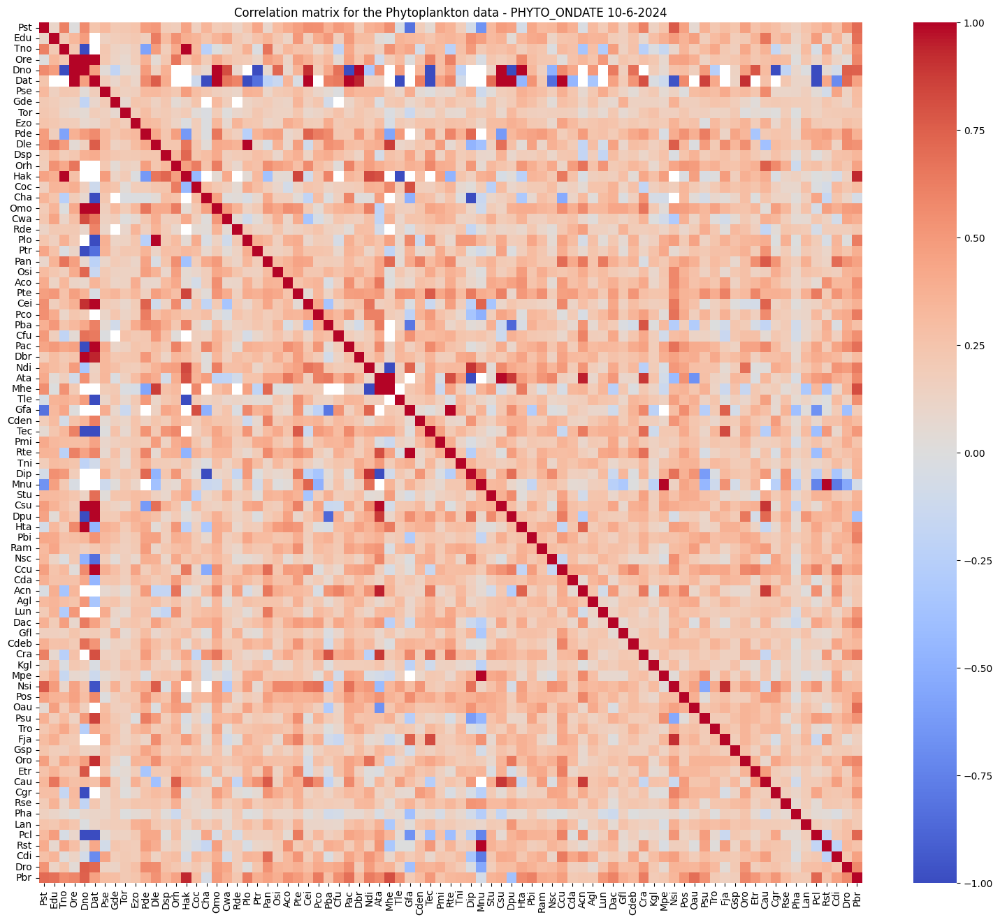

In [6]:
fig, ax = plt.subplots(figsize=(19,16))
plt.title("Correlation matrix for the Phytoplankton data - PHYTO_ONDATE 10-6-2024")
sns.heatmap(phyto_corr_matrix, cmap=plt.get_cmap('coolwarm'), cbar=True, ax=ax)
plt.savefig('phyto_corr_matrix.png')

<Axes: title={'center': 'Correlation matrix for the Phytoplankton data with abs(correlation) > 0.5 - PHYTO_ONDATE 10-6-2024'}>

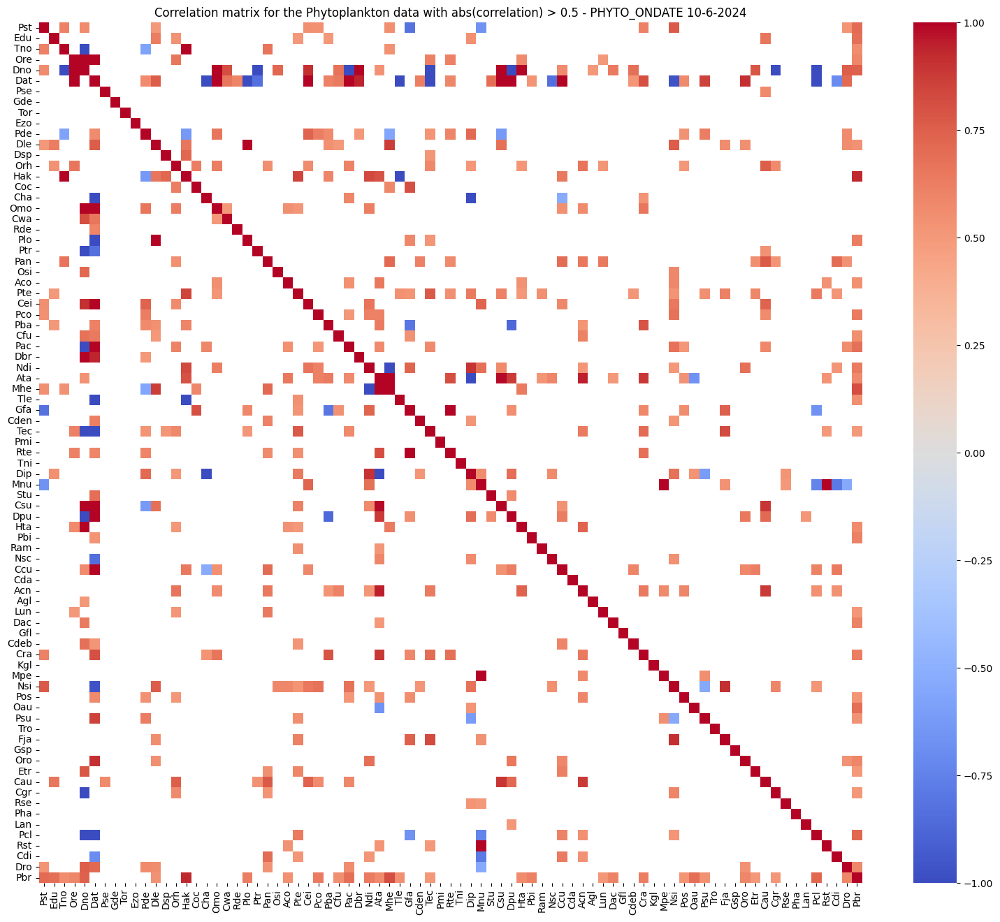

In [7]:
# setting a threshold for the max subset correlation matrix
intensity_threshold = 0.5

threshold_phyto_corr_matrix = phyto_corr_matrix.mask(abs(phyto_corr_matrix) < intensity_threshold)

fig, ax = plt.subplots(figsize=(19,16))
plt.title(f"Correlation matrix for the Phytoplankton data with abs(correlation) > {intensity_threshold} - PHYTO_ONDATE 10-6-2024")
sns.heatmap(threshold_phyto_corr_matrix, cmap=plt.get_cmap('coolwarm'), cbar=True, ax=ax)

In [8]:
percent_missing = biotic_df.isnull().sum() * 100 / len(biotic_df)

print(percent_missing.to_string())

LOC_CODE            0.000000
DATUMTIJDWAARDE     0.000000
Acn                96.538010
Aco                93.979933
Ata                98.354877
Agl                74.961584
Cfu                90.156377
Ccu                95.308687
Cda                86.983639
Cdeb               83.033535
Cden               90.002712
Cdi                92.470397
Cei                95.796800
Csu                89.668264
Cha                97.559432
Coc                94.034168
Cau                97.351532
Cgr                95.534665
Cra                94.377655
Cwa                95.272530
Dpu                96.754949
Dsp                93.907620
Dac                92.886197
Dno                98.915303
Dro                92.190183
Dip                94.513242
Dle                95.887192
Dbr                72.240803
Etr                88.041218
Ezo                81.207629
Edu                82.247130
Fja                94.106481
Gde                69.257887
Gfl                73.063364
Gsp           

['SALNTT', 'pH', 'E', 'NH4', 'ZS', 'ZICHT', 'PO4', 'SiO2', 'NO3', 'NO2', 'CHLFa', 'T']
LOC_CODE            0.000000
DATUMTIJDWAARDE     0.000000
ZS                  5.804129
ZICHT              56.682095
T                   7.530674
SiO2                7.192712
SALNTT             12.276835
PO4                 7.038425
pH                  9.338035
NO3                 9.698038
NO2                 6.979649
NH4                 7.155977
E                  63.669091
CHLFa               7.971494


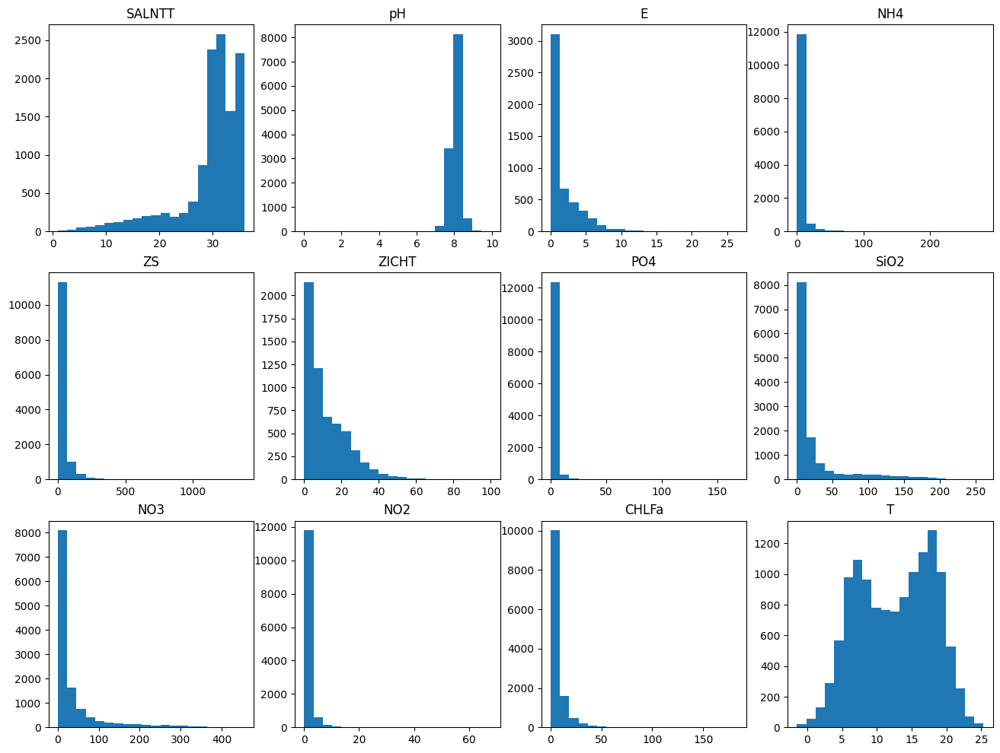

In [9]:
percent_missing = abiotic_df.isnull().sum() * 100 / len(abiotic_df)

plot_data_distributions(abiotic_df, bins=20)

print(percent_missing.to_string())

We did a lil interpolation below, but the "ZICHT" column still has around 42% missing values, since i only interpolate within the grouped dates for locations and some locations have no ZICHT measurements

/tmp/ipykernel_6283/385276240.py:2: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)
/tmp/ipykernel_6283/385276240.py:2: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)
/tmp/ipykernel_6283/385276240.py:2: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE")

['SALNTT', 'pH', 'E', 'NH4', 'ZS', 'ZICHT', 'PO4', 'SiO2', 'NO3', 'NO2', 'CHLFa', 'T']
LOC_CODE            0.000000
DATUMTIJDWAARDE     0.000000
ZS                  0.000000
ZICHT              41.892587
T                   0.000000
SiO2                0.000000
SALNTT              0.000000
PO4                 0.000000
pH                  0.000000
NO3                 0.000000
NO2                 0.000000
NH4                 0.000000
E                   0.000000
CHLFa               0.000000


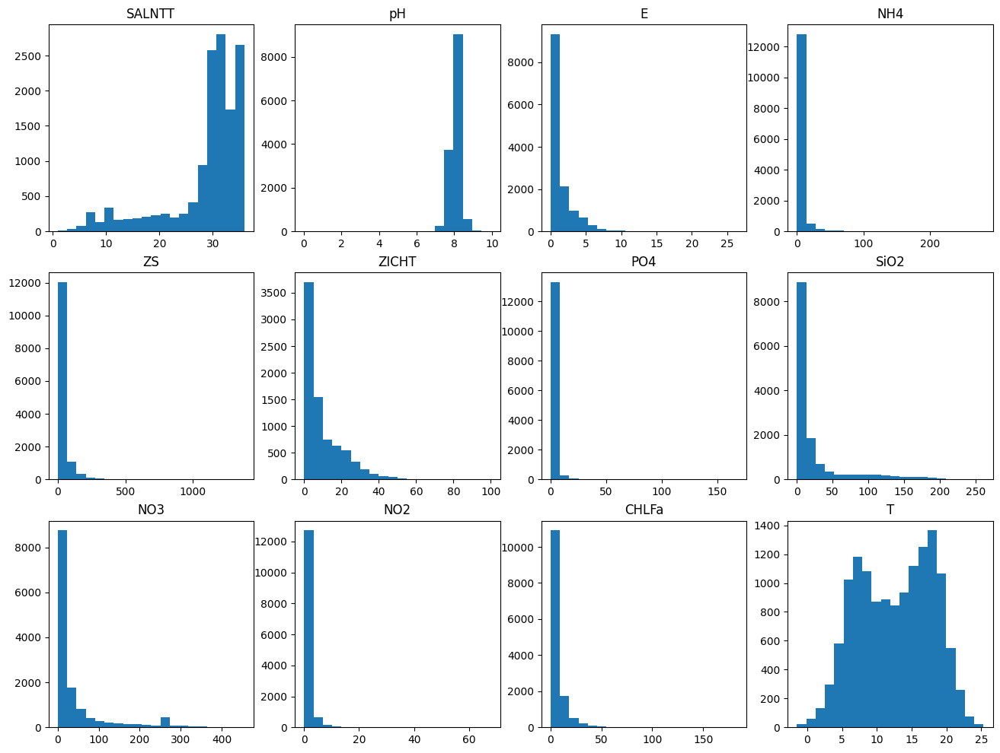

In [10]:
# lets do a lil interpolatin :O
interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)

plot_data_distributions(interpolated_abiotic_df, bins=20)

percent_missing = interpolated_abiotic_df.isnull().sum() * 100 / len(interpolated_abiotic_df)

print(percent_missing.to_string())

In [11]:
parameter_columns = list(set(abiotic_columns) - location_time_set)

# we gotta normalize the values for the different variables prior to analysis
abio_data_scaler = StandardScaler()

abio_data_scaler.fit(interpolated_abiotic_df[parameter_columns])
normalized_data = abio_data_scaler.transform(interpolated_abiotic_df[parameter_columns])

# we normalized the values for all parameters
interpolated_abiotic_df[parameter_columns] = normalized_data

# however, since the ZICHT column is still missing a lot of data, we simply drop it for analysis for now
parameters_minus_ZICHT = list(set(parameter_columns) - {"ZICHT"})

abiotic_PCA = PCA(n_components=3)
abiotic_PCA.fit(interpolated_abiotic_df[parameters_minus_ZICHT])
low_dim_result = abiotic_PCA.transform(interpolated_abiotic_df[parameters_minus_ZICHT])

print("Before PCA: ",interpolated_abiotic_df.shape , "\nAfter PCA: ", low_dim_result.shape)
display(low_dim_result)
print(low_dim_result.shape)

Before PCA:  (13611, 14) 
After PCA:  (13611, 3)


array([[-0.92808081,  1.89071662, -1.5067229 ],
       [-1.69340312,  2.59935312, -3.14139276],
       [ 0.68944619,  1.14640244,  0.31328907],
       ...,
       [ 1.62866673, -0.29282435,  0.28933237],
       [ 1.47248811, -0.45591878,  0.17730886],
       [ 1.34746884, -0.9343535 , -0.28440392]])

(13611, 3)


/tmp/ipykernel_6283/1744645959.py:6: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(low_dim_result[:, 0], low_dim_result[:, 1], low_dim_result[:, 2], cmap='coolwarm')


Text(0.5, 0, 'Principal Component 3')

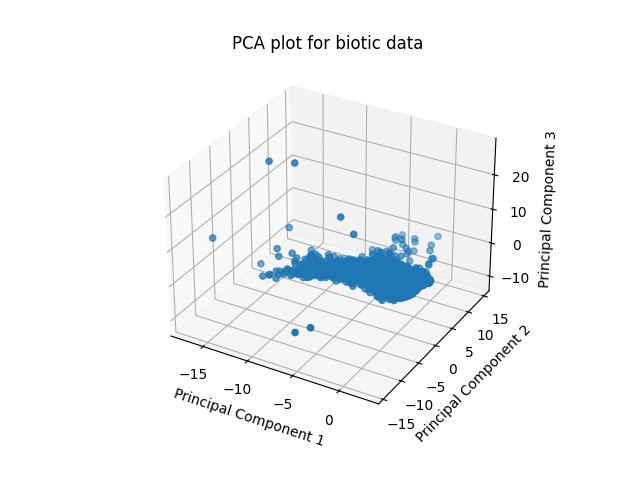

In [12]:
%matplotlib widget 
 
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(low_dim_result[:, 0], low_dim_result[:, 1], low_dim_result[:, 2], cmap='coolwarm')
  
ax.set_title("PCA plot for biotic data")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")

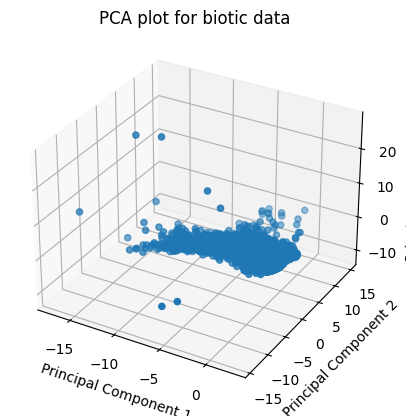

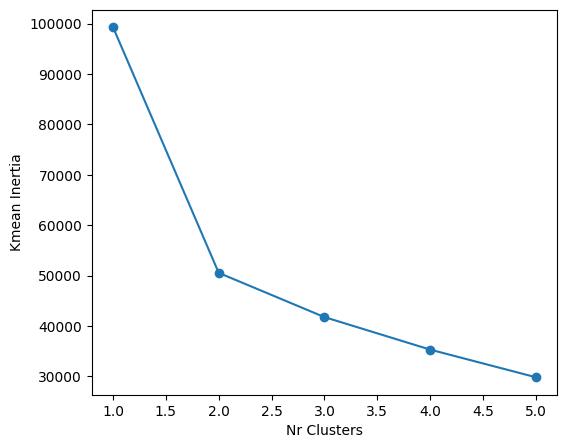

In [13]:
%matplotlib inline 

def plot_inertia(input, nr_clusters_limit):
    inertia_list = []

    cluster_counts = range(1,nr_clusters_limit)

    for nr_clusters in cluster_counts:
        abiotic_kmeans = KMeans(n_clusters=nr_clusters, n_init='auto')
        abiotic_kmeans.fit(input)
        inertia_list.append(abiotic_kmeans.inertia_)

    fig = plt.figure(figsize=(6, 5))

    plt.plot(cluster_counts, inertia_list, marker='o')
    plt.xlabel('Nr Clusters')
    plt.ylabel('Kmean Inertia')

plot_inertia(low_dim_result, 6)

(13611, 3)
(13611, 3)


Text(0.5, 0.92, '3D K-Means plot with k=3 clusters')

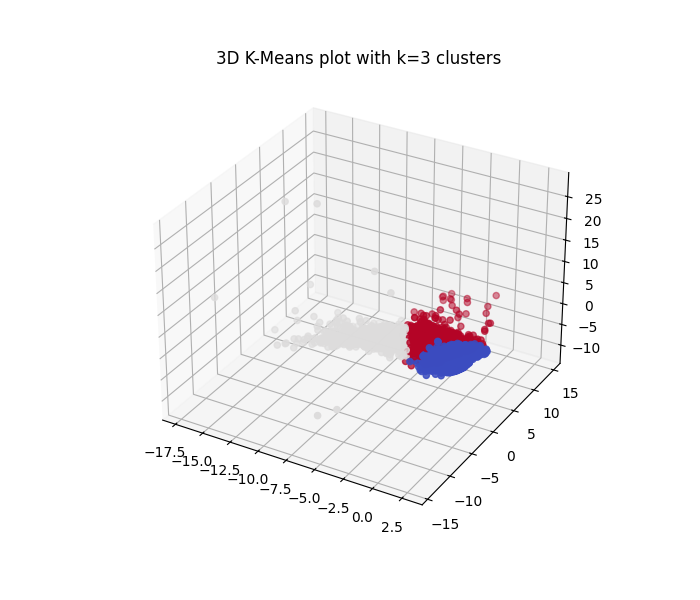

In [15]:
%matplotlib widget 
# as can be seen above, the value of k=3 would be a fine value for the clustering
optimal_clusters = 3
print(low_dim_result.shape)

abiotic_kmeans = KMeans(n_clusters=optimal_clusters, n_init='auto')
abiotic_kmeans.fit(low_dim_result)

fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(projection='3d')

print(low_dim_result.shape)

ax.scatter(low_dim_result[:, 0], low_dim_result[:, 1], low_dim_result[:, 2], c=abiotic_kmeans.labels_, cmap='coolwarm')
  
ax.set_title(f"3D K-Means plot with k={optimal_clusters} clusters") 

Text(0.5, 0.92, '3D K-Means plot with k=3 clusters')

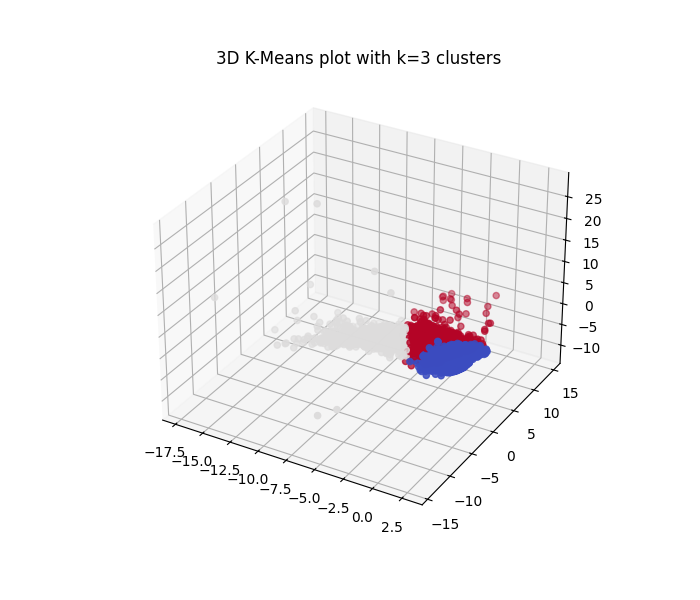

In [16]:
# testing to see whether the addition of a cluster column works

fig = plt.figure(figsize=(7, 6))
ax = fig.add_subplot(projection='3d')

low_dim_result = np.hstack((low_dim_result, np.asarray(abiotic_kmeans.labels_).reshape(len(abiotic_kmeans.labels_), 1)))

ax.scatter(low_dim_result[:, 0], low_dim_result[:, 1], low_dim_result[:, 2], c=low_dim_result[:, 3], cmap='coolwarm')
  
ax.set_title(f"3D K-Means plot with k={optimal_clusters} clusters") 

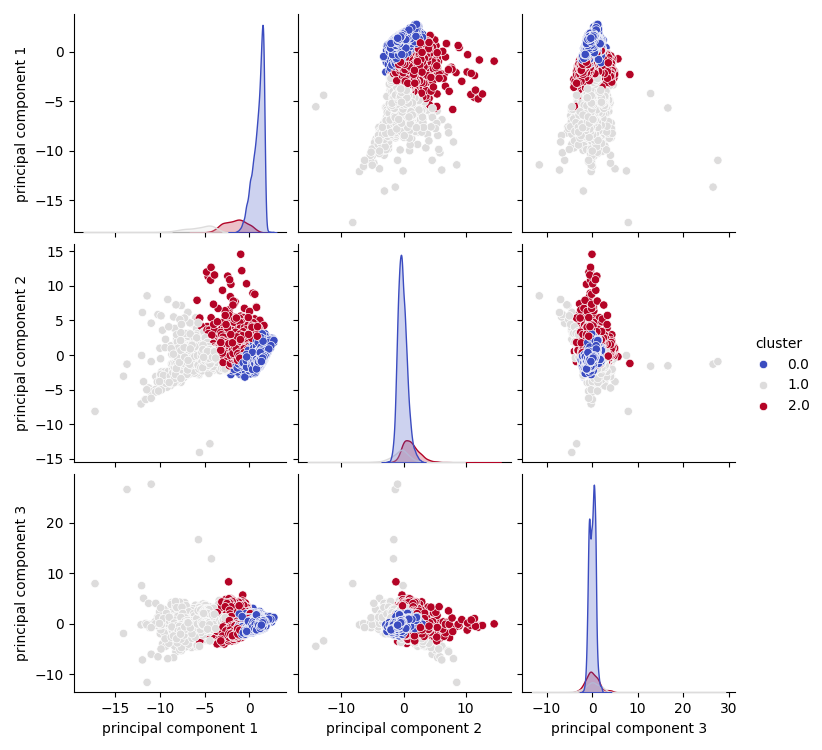

In [17]:
clustered_df_loctime = abiotic_df[list(location_time_set)].copy(deep=True)

low_dim_df = pd.DataFrame(low_dim_result, columns=["principal component 1", "principal component 2", "principal component 3", "cluster"])

clustered_df = pd.concat([clustered_df_loctime, low_dim_df], axis=1)

sns.pairplot(clustered_df, hue='cluster', palette='coolwarm')
plt.show()

In [18]:
sil_score = silhouette_score(low_dim_result, abiotic_kmeans.labels_)
db_index = davies_bouldin_score(low_dim_result, abiotic_kmeans.labels_)
ch_score = calinski_harabasz_score(low_dim_result, abiotic_kmeans.labels_)

print(f'Silhouette Score: {sil_score}')
print(f'Davies-Bouldin Index: {db_index}')
print(f'Calinski-Harabasz Index: {ch_score}')

Silhouette Score: 0.5519686113064179
Davies-Bouldin Index: 1.0369945355036931
Calinski-Harabasz Index: 10555.544187372443


---
## Higher-Dimensional PCA Analysis

Before PCA:  (13611, 14) 
After PCA:  (13611, 5)


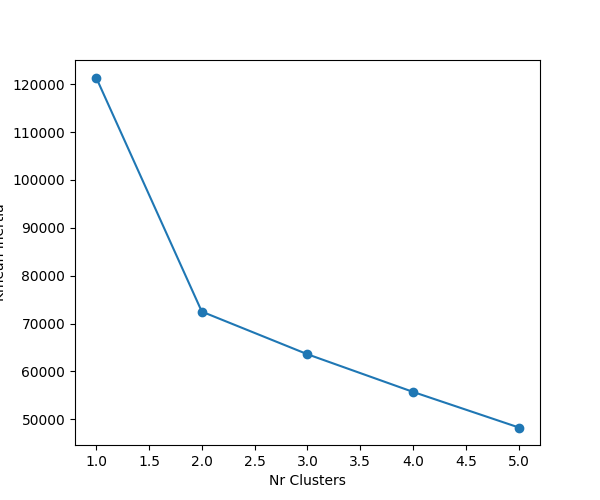

In [19]:
PCA_component_count = 5

abiotic_PCA = PCA(n_components=PCA_component_count)
abiotic_PCA.fit(interpolated_abiotic_df[parameters_minus_ZICHT])
mid_dim_result = abiotic_PCA.transform(interpolated_abiotic_df[parameters_minus_ZICHT])

print("Before PCA: ",interpolated_abiotic_df.shape , "\nAfter PCA: ", mid_dim_result.shape)

plot_inertia(mid_dim_result, 6)


In [20]:
# as can be seen above, the value of k=3 would be a fine value for the clustering
optimal_clusters = 3

abiotic_kmeans_mid_dim = KMeans(n_clusters=optimal_clusters, n_init='auto')
abiotic_kmeans_mid_dim.fit(mid_dim_result)

print(abiotic_kmeans_mid_dim.labels_)

mid_dim_result = np.hstack((mid_dim_result, np.asarray(abiotic_kmeans_mid_dim.labels_).reshape(len(abiotic_kmeans_mid_dim.labels_), 1)))

[0 1 0 ... 0 0 0]


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,cluster
0,-0.928081,1.890717,-1.506723,-0.257436,0.681755,0.0
1,-1.693403,2.599353,-3.141393,0.536907,-1.078145,1.0
2,0.689446,1.146402,0.313289,0.572708,-0.305582,0.0
3,0.363942,0.995310,0.218528,0.582013,-0.086383,0.0
4,-1.624347,1.306129,-1.500719,-0.235256,0.602831,1.0
...,...,...,...,...,...,...
13606,1.617589,-0.389553,0.622543,0.960571,-0.007607,0.0
13607,1.575047,-0.402837,0.556851,1.021703,0.116037,0.0
13608,1.628667,-0.292824,0.289332,0.378869,0.004811,0.0
13609,1.472488,-0.455919,0.177309,0.083637,-0.004109,0.0


(13611, 2)
(13611, 6)
(13611, 8)


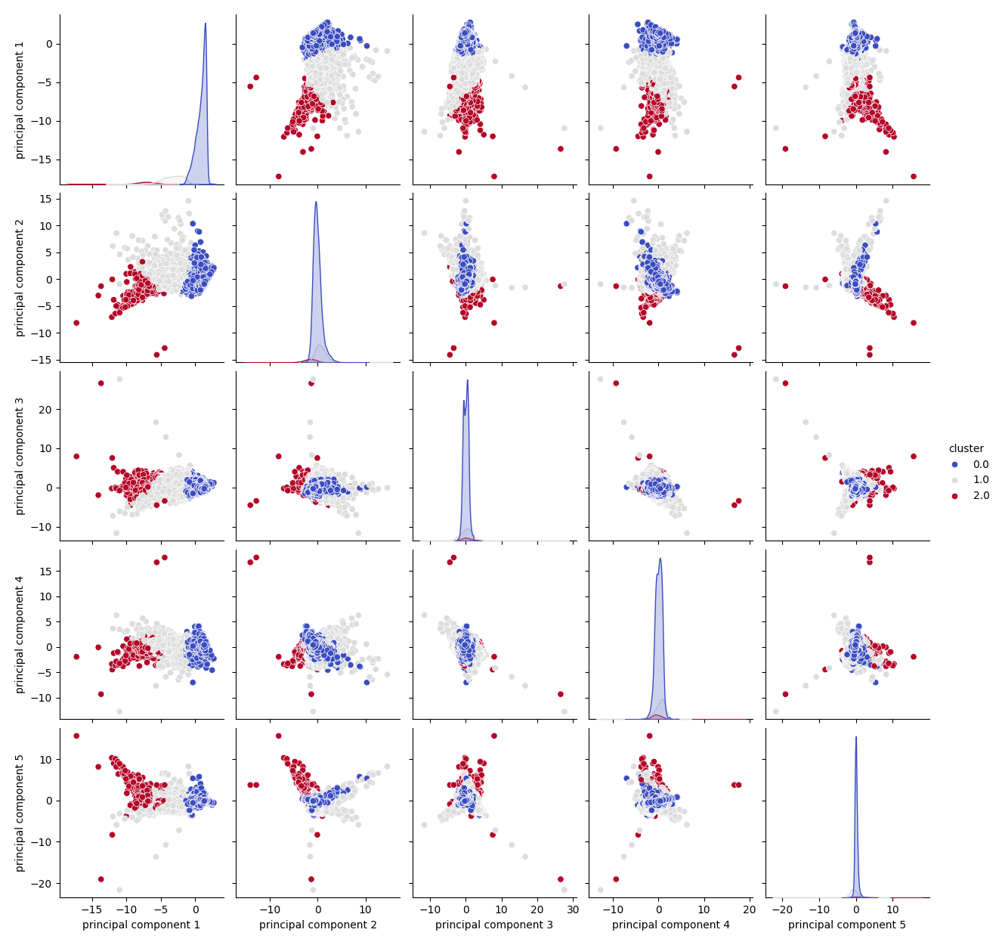

In [21]:
clustered_df_loctime = abiotic_df[list(location_time_set)].copy(deep=True)

mid_dim_df = pd.DataFrame(mid_dim_result, columns=["principal component 1", "principal component 2", "principal component 3", "principal component 4", "principal component 5", "cluster"])

display(mid_dim_df)
clustered_df = pd.concat([clustered_df_loctime, mid_dim_df], axis=1)

print(clustered_df_loctime.shape)
print(mid_dim_result.shape)
print(clustered_df.shape)

sns.pairplot(clustered_df, hue='cluster', palette='coolwarm')
plt.show() 

In [ ]:
sil_score = silhouette_score(mid_dim_result, abiotic_kmeans_mid_dim.labels_)
db_index = davies_bouldin_score(mid_dim_result, abiotic_kmeans_mid_dim.labels_)
ch_score = calinski_harabasz_score(mid_dim_result, abiotic_kmeans_mid_dim.labels_)

print(f'Silhouette Score: {sil_score}')
print(f'Davies-Bouldin Index: {db_index}')
print(f'Calinski-Harabasz Index: {ch_score}')

Silhouette Score: 0.3042885857652938
Davies-Bouldin Index: 1.1663427393237635
Calinski-Harabasz Index: 6837.637088152087


Scores zijn mua, niet super maar ook niet heel slecht. Gewoon redelijk.

---

## Clustering based on raw variables

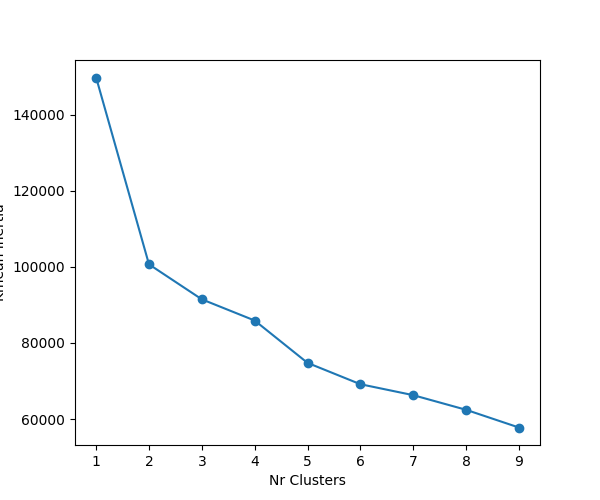

In [22]:
plot_inertia(interpolated_abiotic_df[parameters_minus_ZICHT], 10)

[4 4 0 ... 0 0 2]


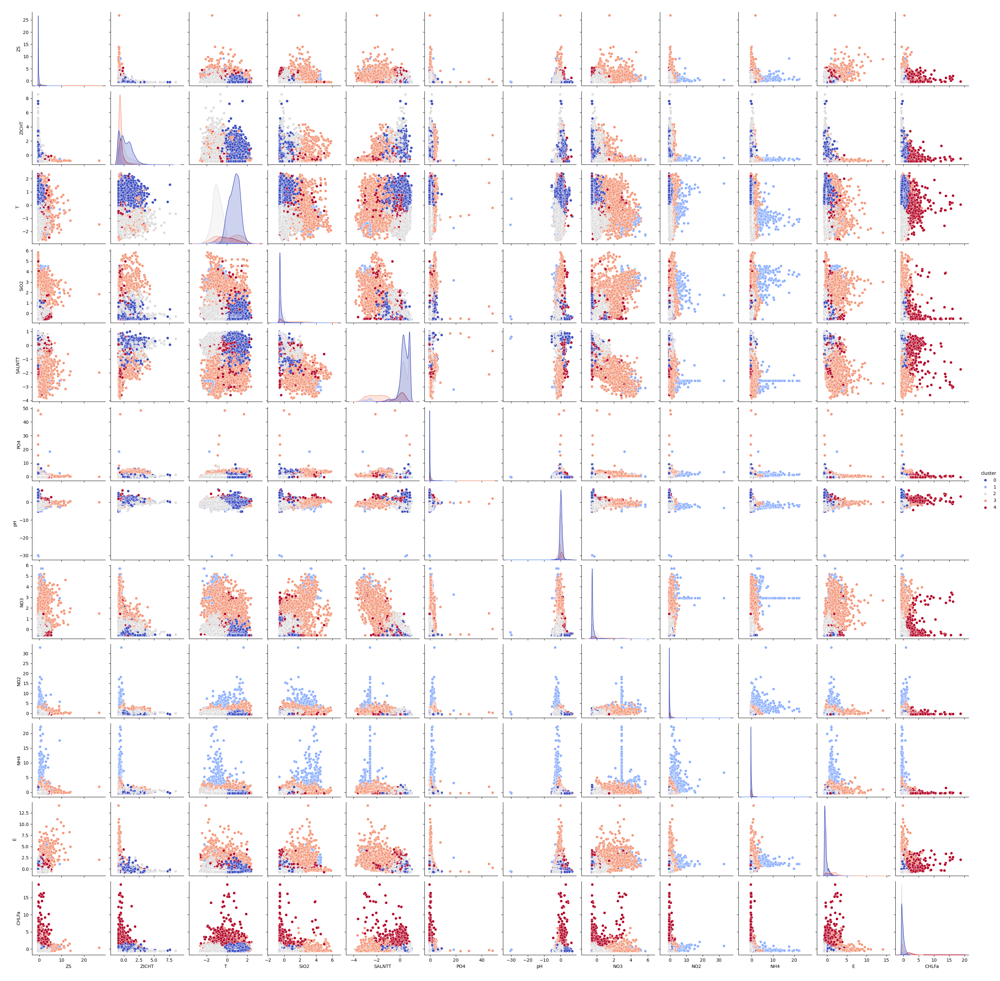

In [23]:
optimal_clusters = 5

abiotic_kmeans_raw = KMeans(n_clusters=optimal_clusters, n_init='auto')
abiotic_kmeans_raw.fit(interpolated_abiotic_df[parameters_minus_ZICHT])

print(abiotic_kmeans_raw.labels_)

# raw_dim_result = np.hstack((interpolated_abiotic_df, np.asarray(abiotic_kmeans_raw.labels_).reshape(len(abiotic_kmeans_raw.labels_), 1)))

interpolated_abiotic_df["cluster"] = abiotic_kmeans_raw.labels_

sns.pairplot(interpolated_abiotic_df, hue='cluster', palette='coolwarm')
plt.show() 

In [ ]:
sil_score = silhouette_score(interpolated_abiotic_df[parameters_minus_ZICHT], abiotic_kmeans_mid_dim.labels_)
db_index = davies_bouldin_score(interpolated_abiotic_df[parameters_minus_ZICHT], abiotic_kmeans_mid_dim.labels_)
ch_score = calinski_harabasz_score(interpolated_abiotic_df[parameters_minus_ZICHT], abiotic_kmeans_mid_dim.labels_)

print(f'Silhouette Score: {sil_score}')
print(f'Davies-Bouldin Index: {db_index}')
print(f'Calinski-Harabasz Index: {ch_score}')

Silhouette Score: 0.20468624056964932
Davies-Bouldin Index: 1.4863736094584852
Calinski-Harabasz Index: 4317.659496169721


bruh this shit is ASS, got me having a better estimate if i just guessed the goddamn clusters.

---

## Time Series K-Means

In [24]:
print([x.value for x in interpolated_abiotic_df["DATUMTIJDWAARDE"]])

[639187200000000000, 644284800000000000, 645840000000000000, 648259200000000000, 649641600000000000, 650678400000000000, 652492800000000000, 653702400000000000, 654739200000000000, 656121600000000000, 658540800000000000, 660960000000000000, 663984000000000000, 667526400000000000, 668908800000000000, 671673600000000000, 674265600000000000, 681609600000000000, 684374400000000000, 684460800000000000, 686793600000000000, 691027200000000000, 691977600000000000, 693100800000000000, 695952000000000000, 698457600000000000, 701308800000000000, 703296000000000000, 704419200000000000, 705715200000000000, 706838400000000000, 708652800000000000, 709344000000000000, 711072000000000000, 712281600000000000, 713404800000000000, 714787200000000000, 715996800000000000, 716256000000000000, 717206400000000000, 721440000000000000, 723772800000000000, 727574400000000000, 731376000000000000, 735264000000000000, 737683200000000000, 740188800000000000, 741398400000000000, 741744000000000000, 743040000000000000,

In [25]:
interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)

# we gotta normalize the values for the different variables prior to analysis
abio_data_scaler = StandardScaler()

abio_data_scaler.fit(interpolated_abiotic_df[parameter_columns])
normalized_data = abio_data_scaler.transform(interpolated_abiotic_df[parameter_columns])

# we normalized the values for all parameters
interpolated_abiotic_df[parameter_columns] = normalized_data


locations = interpolated_abiotic_df["LOC_CODE"].unique()

# percent_missing = interpolated_abiotic_df.isnull().sum() * 100 / len(interpolated_abiotic_df)

# print(percent_missing.to_string())
# print(interpolated_abiotic_df["LOC_CODE"].value_counts())

interpolated_abiotic_df = interpolated_abiotic_df.drop("ZICHT", axis=1)

interpolated_abiotic_df['DATUMTIJDWAARDE'] = interpolated_abiotic_df['DATUMTIJDWAARDE'].apply(lambda x: x.value)

display(interpolated_abiotic_df)

abiotic_data_tensor = []


for location in locations:
    single_location_df = interpolated_abiotic_df.loc[interpolated_abiotic_df["LOC_CODE"] == location].drop("LOC_CODE", axis=1)

    abiotic_data_tensor.append(single_location_df.to_numpy())
    # print(abiotic_data_tensor)

max_obs_length = max([x.shape[0] for x in abiotic_data_tensor])

for i, matrix in enumerate(abiotic_data_tensor):
    padding_size = (max_obs_length - matrix.shape[0], matrix.shape[1])

    padding = np.zeros(padding_size)

    abiotic_data_tensor[i] = np.concatenate((matrix, padding), axis=0)


# Print the shape of each element in time_series_list
for idx, ts in enumerate(abiotic_data_tensor):
    print(f"Shape of time series for location {idx}: {ts.shape}")



n_clusters = 5

ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", random_state=0)
labels = ts_kmeans.fit_predict(abiotic_data_tensor)

# def plot_clusters(data, labels, n_clusters):
#     plt.figure(figsize=(15, 10))
#     for cluster in range(n_clusters):
#         plt.subplot(n_clusters, 1, cluster + 1)
#         for location in range(n_locations):
#             if labels[location] == cluster:
#                 plt.plot(data[location].mean(axis=1), "k-", alpha=0.2)
#         plt.plot(model.cluster_centers_[cluster].ravel(), "r-", linewidth=2)
#         plt.title(f"Cluster {cluster + 1}")
#     plt.tight_layout()
#     plt.show()

# # Plot the clustered time series
# plot_clusters(data_normalized, labels, n_clusters)

/tmp/ipykernel_6283/475983517.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)
/tmp/ipykernel_6283/475983517.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE").apply(lambda group: group.interpolate(method="linear", limit_direction="both")).reset_index(drop=True)
/tmp/ipykernel_6283/475983517.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  interpolated_abiotic_df = abiotic_df.groupby("LOC_CODE")

,LOC_CODE,DATUMTIJDWAARDE,ZS,T,SiO2,SALNTT,PO4,pH,NO3,NO2,NH4,E,CHLFa
0,DANTZGT,639187200000000000,1.686355,-0.835645,-0.416071,0.011711,-0.235756,0.151277,-0.012881,0.453272,0.121926,1.032773,1.973046
1,DANTZGT,644284800000000000,5.296363,-1.251005,-0.387593,-0.184643,-0.141799,0.530538,-0.285911,-0.005109,-0.051965,1.032773,0.976843
2,DANTZGT,645840000000000000,0.099539,1.033473,-0.359116,0.550995,-0.047843,0.909800,-0.558941,-0.463490,-0.225857,1.032773,-0.019360
3,DANTZGT,648259200000000000,0.218550,0.825793,-0.421328,0.441755,0.093092,0.530538,-0.557959,-0.181409,-0.051965,1.032773,0.160804
4,DANTZGT,649641600000000000,1.488003,-1.005565,-0.093620,-0.513745,-0.263943,-0.227985,0.664783,0.488532,0.301615,1.032773,1.559727
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,WALCRN70,1597276800000000000,-0.475286,1.108993,-0.554777,0.870416,-0.302465,-0.227985,-0.557959,-0.516380,-0.385258,-0.706480,-0.594827
13607,WALCRN70,1600214400000000000,-0.465368,1.108993,-0.539005,0.842761,-0.415213,-0.341764,-0.531540,-0.477594,-0.360334,-0.729664,-0.520641
13608,WALCRN70,1602633600000000000,-0.456046,0.580354,-0.529016,0.856589,-0.410515,0.189203,-0.557959,-0.414126,-0.370188,-0.729664,-0.462353
13609,WALCRN70,1605571200000000000,-0.477269,0.240514,-0.481788,0.870416,-0.342866,0.265055,-0.474282,-0.117941,-0.385258,-0.729664,-0.507924


Shape of time series for location 0: (941, 12)
Shape of time series for location 1: (941, 12)
Shape of time series for location 2: (941, 12)
Shape of time series for location 3: (941, 12)
Shape of time series for location 4: (941, 12)
Shape of time series for location 5: (941, 12)
Shape of time series for location 6: (941, 12)
Shape of time series for location 7: (941, 12)
Shape of time series for location 8: (941, 12)
Shape of time series for location 9: (941, 12)
Shape of time series for location 10: (941, 12)
Shape of time series for location 11: (941, 12)
Shape of time series for location 12: (941, 12)
Shape of time series for location 13: (941, 12)
Shape of time series for location 14: (941, 12)
Shape of time series for location 15: (941, 12)
Shape of time series for location 16: (941, 12)
Shape of time series for location 17: (941, 12)
Shape of time series for location 18: (941, 12)
Shape of time series for location 19: (941, 12)
Shape of time series for location 20: (941, 12)
Sh

In [26]:
print(labels)

inertia_list = []

cluster_counts = range(1, 5)

for nr_clusters in cluster_counts:
    ts_kmeans = TimeSeriesKMeans(n_clusters=nr_clusters, metric="dtw", random_state=0)
    ts_kmeans.fit(abiotic_data_tensor)

    inertia_list.append(ts_kmeans.inertia_)

fig = plt.figure(figsize=(6, 5))

plt.plot(cluster_counts, inertia_list, marker='o')
plt.xlabel('Nr Clusters')
plt.ylabel('Kmean Inertia')

[3 3 3 3 3 3 3 3 1 3 3 3 0 0 0 3 3 3 3 3 4 4 2 3 3 3 3]


KeyboardInterrupt: 

In [27]:
n_clusters = 3

ts_kmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", random_state=0)
labels = ts_kmeans.fit_predict(abiotic_data_tensor)

KeyboardInterrupt: 

In [30]:
print(labels)

[3 3 3 3 3 3 3 3 1 3 3 3 0 0 0 3 3 3 3 3 4 4 2 3 3 3 3]
